In [2]:
#%matplotlib inline
import sys 
import os 
import glob
import numpy as np
import scipy as sp
import matplotlib
import matplotlib.gridspec as gridspec
import pandas as pd
import seaborn as sns
import fnmatch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec  # for unequal plot boxes
import scipy.optimize
import matplotlib.ticker as ticker
import matplotlib.cm as cm
import matplotlib as mpl
import scipy
import scipy.stats
import matplotlib.ticker as ticker
import math
from matplotlib import pyplot as plt
from matplotlib import cm
from matplotlib import colors
from matplotlib.ticker import PercentFormatter
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
from matplotlib.collections import LineCollection
from mpl_toolkits.mplot3d.art3d import Line3DCollection
from mpl_toolkits.mplot3d import Axes3D
from pylab import *
from matplotlib.ticker import NullFormatter, MultipleLocator, FormatStrFormatter, FuncFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable
#from gridData import Grid 
from io import StringIO
from collections import Counter
from scipy import stats
from scipy.stats import norm
from  scipy.stats import gaussian_kde
#from sklearn.neighbors import KernelDensity
#import statsmodels.api as sm
#from statsmodels.graphics.tsaplots import plot_acf
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors
from matplotlib.ticker import PercentFormatter
from pylab import *
from matplotlib.ticker import NullFormatter
from matplotlib import font_manager
import bottleneck as bn
import scipy.stats as st
from cycler import cycler

##Figure fonts and other params ##
hfont = {'fontname':'Helvetica'}
mpl.rcParams['figure.dpi'] =300
mpl.rcParams.update({'font.size': 16})
matplotlib.rcParams['pdf.fonttype'] = 42 

## SS and disorder predictions for prestin Ancestors to compare with AF2 models. 

### RaptorX - SS and Disorder

['>bat']
['>dolphin-model_v4']
['>monodelphis']
['>human']
['>finch-model_v4']
['>lizard-model_v4']
['>opossum_marsup-model_v4']
['>platypus-model_v4']
['>ricefish-model_v4']
['>tetra-model_v4']
['>wombat-model_v4']
['>zebra_finch-model_v4']
['>ancM0']
['>AncM1']
['>AncM2']
['>AncM3']
['>AncAn']
['>AncAv']
['>AncAvR']
['>AncMR']
['>AncP']
['>AncPAn']
['>AncR']


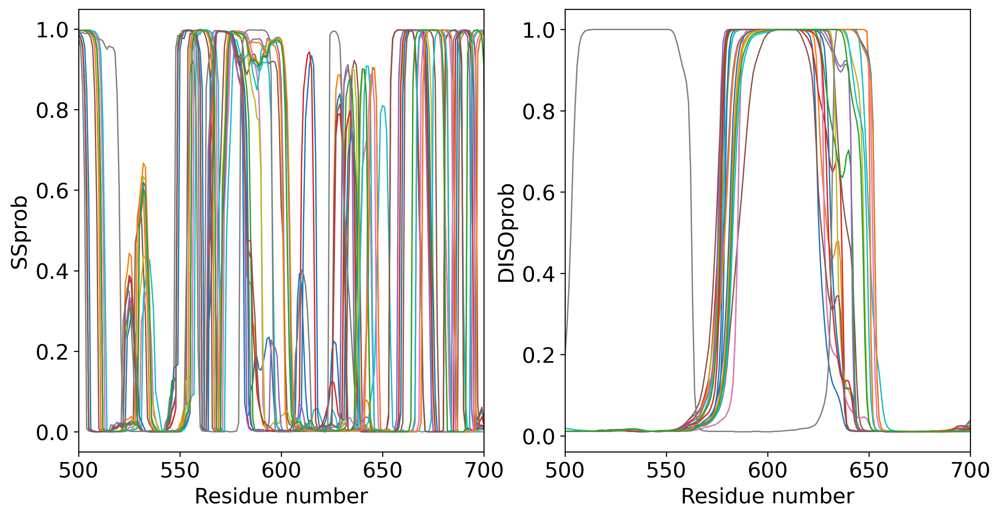

In [84]:
## Load files
#np.genfromtxt(r2C, usecols=(1),skip_header=399)

#Seq_ID 
dirs0 = sorted(glob.glob('/Users/capitank/Dropbox/USS_Lab/Investigacion/Prestin/Prestin_2023/ancestorsV2/validations_theo/pres_raptor_comp.property/*/*.fasta.txt'))
for num0, file in enumerate(dirs0):               
    #print(file)
    with open(file, 'r') as fd0:
        lines1 = fd0.readline().split()
        print (lines1)
    

plt.figure( figsize = (12,6)) 

# SS
plt.subplot(121)
dirs1 = sorted(glob.glob('/Users/capitank/Dropbox/USS_Lab/Investigacion/Prestin/Prestin_2023/ancestorsV2/validations_theo/pres_raptor_comp.property/*/*.ss3.txt'))
for num1, file in enumerate(dirs1):               
    #print(file)
    with open(file, 'r') as fd:
        H1= np.genfromtxt(fd, usecols=(0,3,4,5),skip_header=2)
        #print (H1)
    plt.xlabel('Residue number')
    plt.ylabel('SSprob')
    #plt.title('PCPS(70:30) CGm3pws10')
    plt.plot((H1[:,0]), (H1[:,1]), lw=1)
    #plt.ylim([500, 700])
    plt.xlim([500, 700])

# Disorder
plt.subplot(122)
dirs2 = sorted(glob.glob('/Users/capitank/Dropbox/USS_Lab/Investigacion/Prestin/Prestin_2023/ancestorsV2/validations_theo/pres_raptor_comp.property/*/*.diso.txt'))
for num2, file in enumerate(dirs2):               
    #print(file)
    with open(file, 'r') as fd2:
        D1= np.genfromtxt(fd2, usecols=(0,3),skip_header=3)
        #print (H1)
    plt.xlabel('Residue number')
    plt.ylabel('DISOprob')
    #plt.title('PCPS(70:30) CGm3pws10')
    plt.plot((D1[:,0]), (D1[:,1]), lw=1)
    #plt.ylim([500, 700])
    plt.xlim([500, 700])

     

23


IndexError: index 11 is out of bounds for axis 0 with size 11

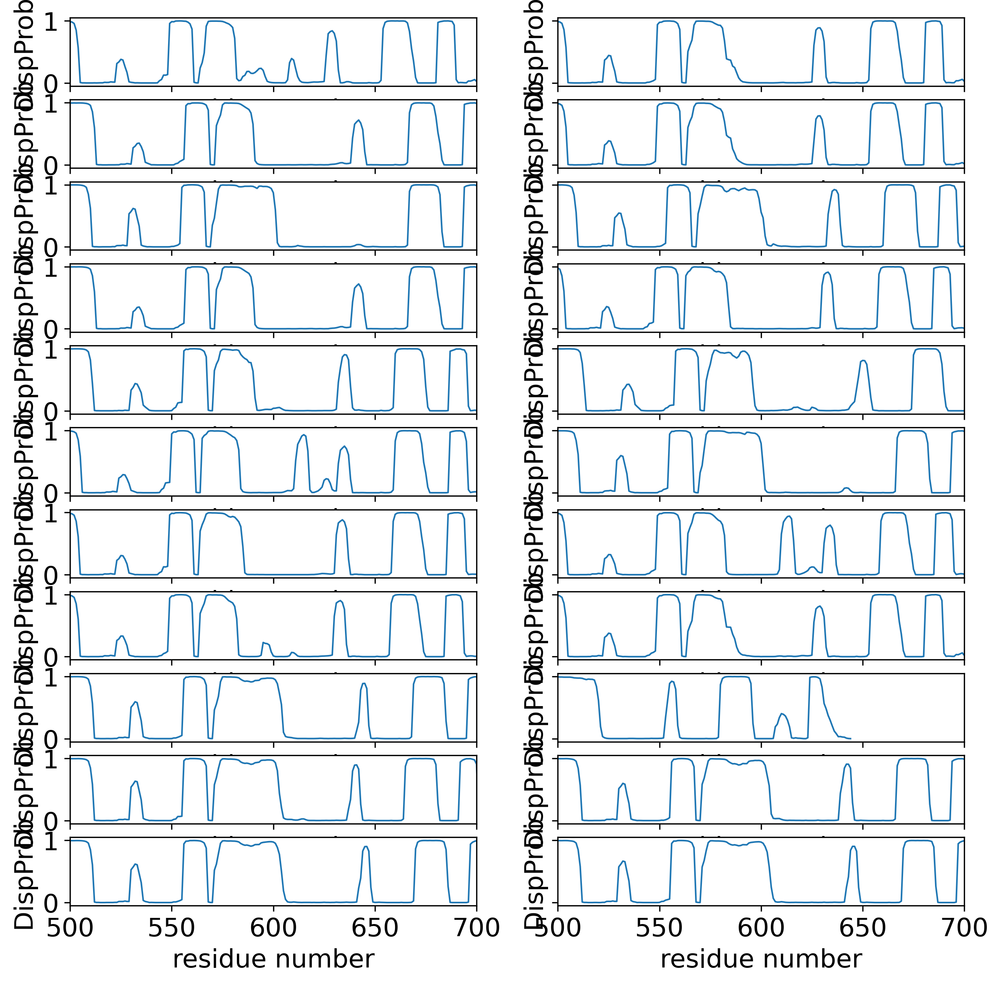

In [100]:
import matplotlib.pyplot as plt
import numpy as np

# Get the list of files in the directory
dirs1 = sorted(glob.glob('/Users/capitank/Dropbox/USS_Lab/Investigacion/Prestin/Prestin_2023/ancestorsV2/validations_theo/pres_raptor_comp.property/*/*.ss3.txt'))

# Create a figure and an axes array
fig, axs = plt.subplots(len(dirs1) // 2, 2, figsize=(10, 10), sharex=True, sharey=True)

# Iterate over the files in the directory
for num1, file in enumerate(dirs1):

    # Print the file name
    #print(file)

    # Open the file and read the data
    with open(file, 'r') as fd:
        H1 = np.genfromtxt(fd, usecols=(0, 3, 4, 5), skip_header=2)

    # Plot the data on the current axes
    axs[num1 // 2, num1 % 2].plot(H1[:, 0], H1[:, 1], lw=1)
    axs[num1 // 2, num1 % 2].set_xlim([500, 700])
    axs[num1 // 2, num1 % 2].set_xlabel("residue number")
    axs[num1 // 2, num1 % 2].set_ylabel("DispProb")

# Show the plot
plt.tight_layout() 
plt.show()

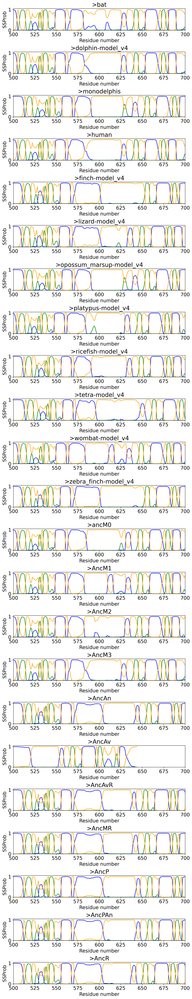

In [126]:
import glob
import numpy as np
import matplotlib.pyplot as plt

dirs0 = sorted(glob.glob('/Users/capitank/Dropbox/USS_Lab/Investigacion/Prestin/Prestin_2023/ancestorsV2/validations_theo/pres_raptor_comp.property/*/*.fasta.txt'))
dirs1 = sorted(glob.glob('/Users/capitank/Dropbox/USS_Lab/Investigacion/Prestin/Prestin_2023/ancestorsV2/validations_theo/pres_raptor_comp.property/*/*.ss3.txt'))

num_plots = len(dirs1)
fig, axes = plt.subplots(num_plots, 1, figsize=(10, 5*num_plots//2), gridspec_kw={'hspace': 1})
#fig, axes = plt.subplots(num_plots//2, 2, figsize=(10, 5*num_plots//4), gridspec_kw={'hspace': 0.5, 'wspace': 0.3}, sharex=True, sharey=True)
#for ax in axes:
#    ax.set_aspect('auto')
# set the figure size to fit the subplots and adjust the vertical spacing between subplots

for i, file in enumerate(dirs1):
    with open(file, 'r') as fd:
        H1= np.genfromtxt(fd, usecols=(0,3,4,5),skip_header=2)
        
    with open(dirs0[i], 'r') as fd0:
        lines1 = fd0.readline().split()
        title = lines1[0] # use the first word in the first line as the title
    
    ax = axes[i]
    ax.plot(H1[:,0], H1[:,1], label='H', color='blue')
    ax.plot(H1[:,0], H1[:,2], label='E', color='green')
    ax.plot(H1[:,0], H1[:,3], label='C', color='orange')
    ax.set_xlim(500, 700)
    ax.set_ylim(0, 1.05)
    ax.set_xlabel('Residue number')
    ax.set_ylabel('SSProb')
    ax.set_title(title)
    #ax.legend()
    ax.set_adjustable('datalim')

#fig.tight_layout()
plt.show()


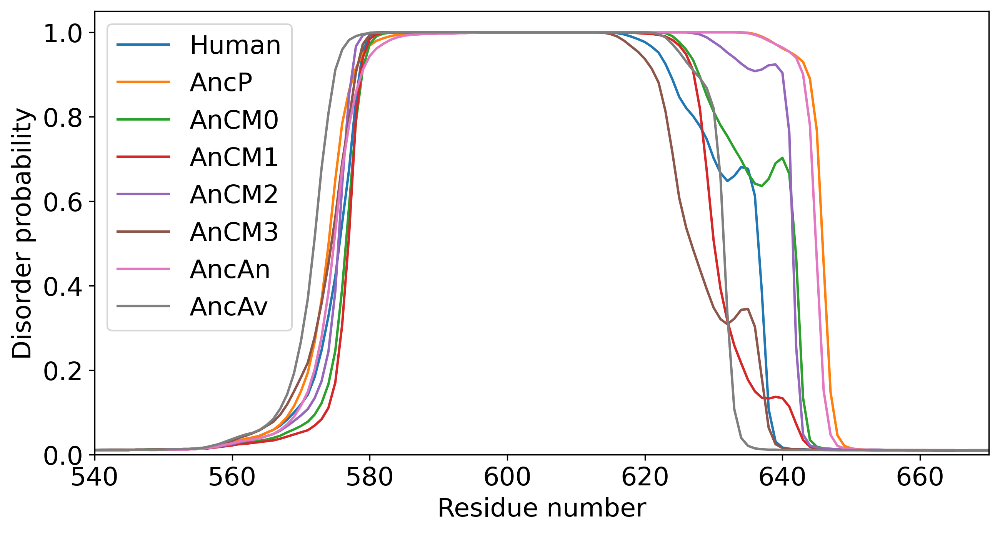

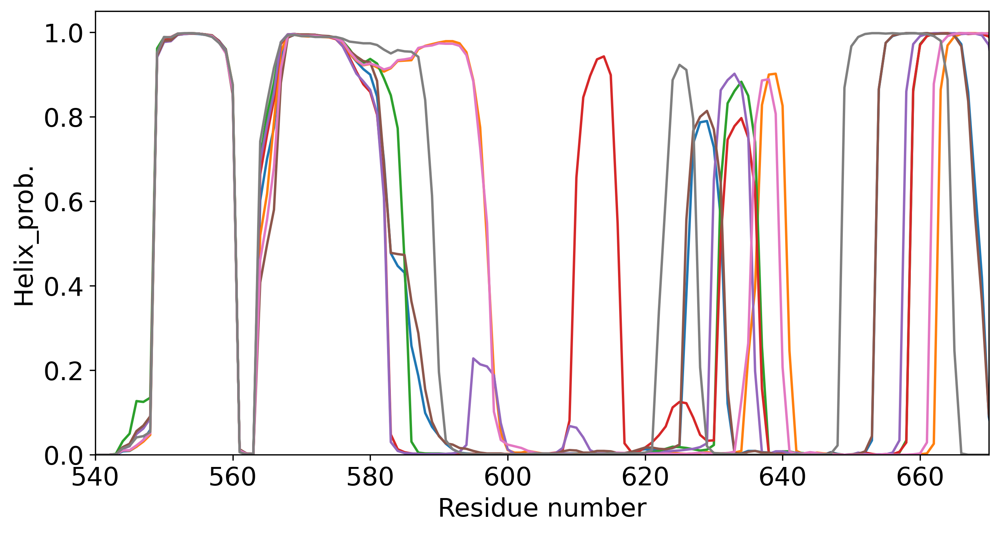

In [215]:
import glob
import numpy as np
import matplotlib.pyplot as plt

# 0['>bat']
# 1['>dolphin-model_v4']
# 2['>monodelphis']
# 3['>human']
# 4['>finch-model_v4']
# 5['>lizard-model_v4']
# 6['>opossum_marsup-model_v4']
# 7['>platypus-model_v4']
# 8['>ricefish-model_v4']
# 9['>tetra-model_v4']
# 10['>wombat-model_v4']
# 11['>zebra_finch-model_v4']
# 12['>ancM0']
# 13['>AncM1']
# 14['>AncM2']
# 15['>AncM3']
# 16['>AncAn']
# 17['>AncAv']
# 18['>AncAvR']
# 19['>AncMR']
# 20['>AncP']
# 21['>AncPAn']
# 22['>AncR']

# get file paths
dirs0 = sorted(glob.glob('/Users/capitank/Dropbox/USS_Lab/Investigacion/Prestin/Prestin_2023/ancestorsV2/validations_theo/pres_raptor_comp.property/*/*.fasta.txt'))
dirs1 = sorted(glob.glob('/Users/capitank/Dropbox/USS_Lab/Investigacion/Prestin/Prestin_2023/ancestorsV2/validations_theo/pres_raptor_comp.property/*/*.diso.txt'))
dirs2 = sorted(glob.glob('/Users/capitank/Dropbox/USS_Lab/Investigacion/Prestin/Prestin_2023/ancestorsV2/validations_theo/pres_raptor_comp.property/*/*.ss3.txt'))

# select specific files from dirs1
selected_files1 = [dirs1[3], dirs1[12], dirs1[13], dirs1[14], dirs1[15], dirs1[20]]
selected_files0 = [dirs0[3], dirs0[12], dirs0[13], dirs0[14], dirs0[15], dirs0[20]]
#selected_files2 = [dirs2[3], dirs2[12], dirs2[13], dirs2[14], dirs2[15], dirs2[20]]
selected_files2 = [dirs2[3],dirs2[20]]


# extract labels from dirs0
labels = []
for file in selected_files0:
    with open(file, 'r') as fd0:
        lines1 = fd0.readline().split()
        labels.append(lines1[0])

# plot data
fig, ax = plt.subplots(figsize=(10, 5))
#for i, file in enumerate(selected_files1):
#    data = np.genfromtxt(file, usecols=(0,3),skip_header=3)
#    ax.plot(data[:, 0], data[:, 1], label=labels[i])

data_H = np.genfromtxt(dirs1[3], usecols=(0,3),skip_header=3)
data_P = np.genfromtxt(dirs1[20], usecols=(0,3),skip_header=3)
data_M0 = np.genfromtxt(dirs1[12], usecols=(0,3),skip_header=3)
data_M1 = np.genfromtxt(dirs1[13], usecols=(0,3),skip_header=3)
data_M2 = np.genfromtxt(dirs1[14], usecols=(0,3),skip_header=3)
data_M3 = np.genfromtxt(dirs1[15], usecols=(0,3),skip_header=3)
data_AncAn = np.genfromtxt(dirs1[16], usecols=(0,3),skip_header=3)
data_AncAv = np.genfromtxt(dirs1[17], usecols=(0,3),skip_header=3)


ax.plot(data_H[:, 0],   data_H[:, 1],  label='Human')
ax.plot(data_P[:, 0]-7, data_P[:, 1],  label='AncP') 
ax.plot(data_M0[:, 0],   data_M0[:, 1],label='AnCM0')
ax.plot(data_M1[:, 0], data_M1[:, 1],  label='AnCM1') 
ax.plot(data_M2[:, 0],   data_M2[:, 1],label='AnCM2')
ax.plot(data_M3[:, 0], data_M3[:, 1],  label='AnCM3') 
ax.plot(data_AncAn[:, 0]-7, data_AncAn[:, 1],  label='AncAn') 
ax.plot(data_AncAv[:, 0]+69, data_AncAv[:, 1],  label='AncAv') 
     
ax.set_xlabel('Residue number')
ax.set_ylabel('Disorder probability')
ax.legend(loc='best')
ax.set_xlim(540, 670)
ax.set_ylim(0, 1.05)

#plot data
fig, ax = plt.subplots(figsize=(10, 5))
#for i, file in enumerate(selected_files2):
#    data = np.genfromtxt(file, usecols=(0,3,4,5),skip_header=2)
#    ax.plot(data[:, 0], data[:, 1], label=labels[i])

data_H = np.genfromtxt(dirs2[3], usecols=(0,3,4,5),skip_header=2)
data_P = np.genfromtxt(dirs2[20], usecols=(0,3,4,5),skip_header=2)
data_M0 = np.genfromtxt(dirs2[12], usecols=(0,3,4,5),skip_header=2)
data_M1 = np.genfromtxt(dirs2[13], usecols=(0,3,4,5),skip_header=2)
data_M2 = np.genfromtxt(dirs2[14], usecols=(0,3,4,5),skip_header=2)
data_M3 = np.genfromtxt(dirs2[15], usecols=(0,3,4,5),skip_header=2)
data_AncAn = np.genfromtxt(dirs2[16], usecols=(0,3,4,5),skip_header=2)
data_AncAv = np.genfromtxt(dirs2[17],usecols=(0,3,4,5),skip_header=2)

#label=labels[i]
ax.plot(data_H[:, 0], data_H[:, 1])
ax.plot(data_P[:, 0]-7, data_P[:, 1])      
ax.plot(data_M0[:, 0],   data_M0[:, 1],label='AnCM0')
ax.plot(data_M1[:, 0], data_M1[:, 1],  label='AnCM1') 
ax.plot(data_M2[:, 0],   data_M2[:, 1],label='AnCM2')
ax.plot(data_M3[:, 0], data_M3[:, 1],  label='AnCM3') 
ax.plot(data_AncAn[:, 0]-7, data_AncAn[:, 1],  label='AncAn') 
ax.plot(data_AncAv[:, 0]+69, data_AncAv[:, 1],  label='AncAv') 
ax.set_xlabel('Residue number')
ax.set_ylabel('Helix_prob.')
#ax.legend(loc='best')
ax.set_xlim(540, 670)
ax.set_ylim(0, 1.05)
    
plt.show()

### Medusa

8


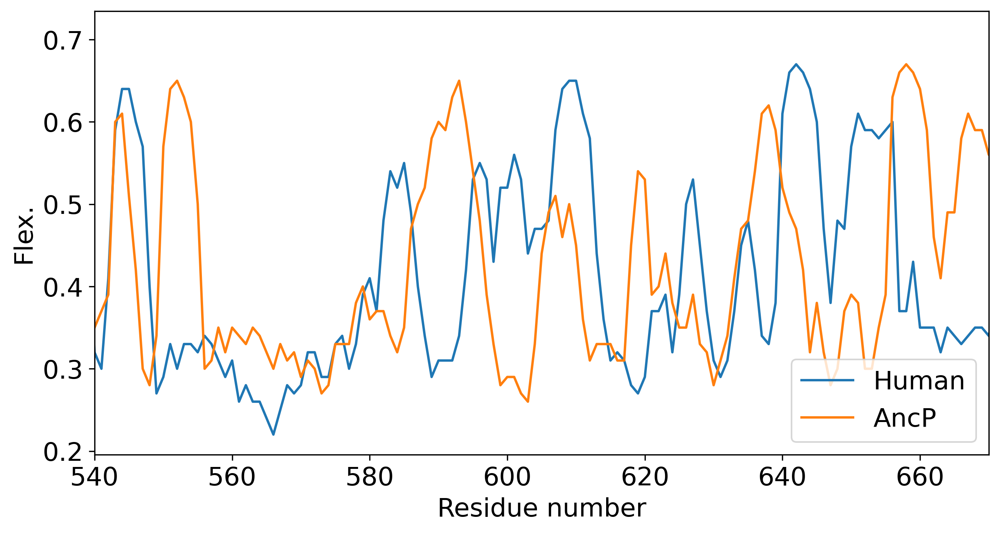

In [228]:

dirs5 = sorted(glob.glob('/Users/capitank/Dropbox/USS_Lab/Investigacion/Prestin/Prestin_2023/ancestorsV2/validations_theo/medusa/*/prediction/5_prediction.csv'))
dirs3 = sorted(glob.glob('/Users/capitank/Dropbox/USS_Lab/Investigacion/Prestin/Prestin_2023/ancestorsV2/validations_theo/medusa/*/prediction/3_prediction.csv'))
dirsS = sorted(glob.glob('/Users/capitank/Dropbox/USS_Lab/Investigacion/Prestin/Prestin_2023/ancestorsV2/validations_theo/medusa/*/prediction/S_prediction.csv'))
print (len(dirs5))

data_H =  np.genfromtxt(dirs5[7],  usecols=(1,2),skip_header=1)
data_P =  np.genfromtxt(dirs5[4], usecols=(1,2),skip_header=1)
#data_M0 = np.genfromtxt(dirs5[12], usecols=(1,2),skip_header=1)
#data_M1 = np.genfromtxt(dirs5[13], usecols=(1,2),skip_header=1)
#data_M2 = np.genfromtxt(dirs5[14], usecols=(1,2),skip_header=1)
#data_M3 = np.genfromtxt(dirs5[15], usecols=(1,2),skip_header=1)
#data_AncAn = np.genfromtxt(dirs5[16], usecols=(1,2),skip_header=1)
#data_AncAv = np.genfromtxt(dirs5[17], usecols=(1,2),skip_header=1)

fig, ax = plt.subplots(figsize=(10, 5))
ax.plot( data_H[:, 1],  label='Human')
ax.plot( data_P[:, 1],  label='AncP')

#ax.plot( data_P[:, 1],  label='AncP') 
#ax.plot( data_M0[:, 1],label='AnCM0')
#ax.plot( data_M1[:, 1],  label='AnCM1') 
#ax.plot( data_M2[:, 1],label='AnCM2')
#ax.plot( data_M3[:, 1],  label='AnCM3') 
#ax.plot(data_AncAn[:, 1],  label='AncAn') 
#ax.plot(data_AncAv[:, 1],  label='AncAv') 
ax.set_xlabel('Residue number')
ax.set_ylabel('Flex.')
ax.legend(loc='best')
ax.set_xlim(540, 670)
#ax.set_ylim(0, 4.1)
plt.show()

## Comparison bw models and structures RMSD and pLDDT from models

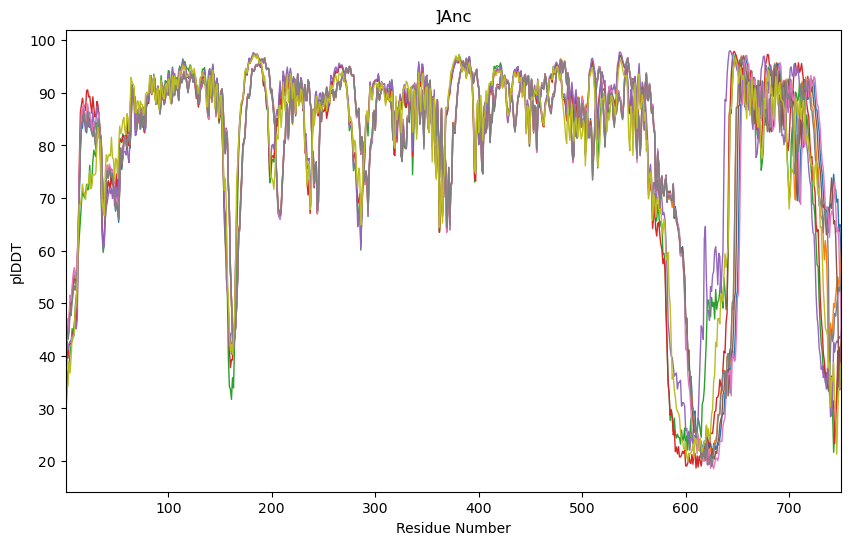

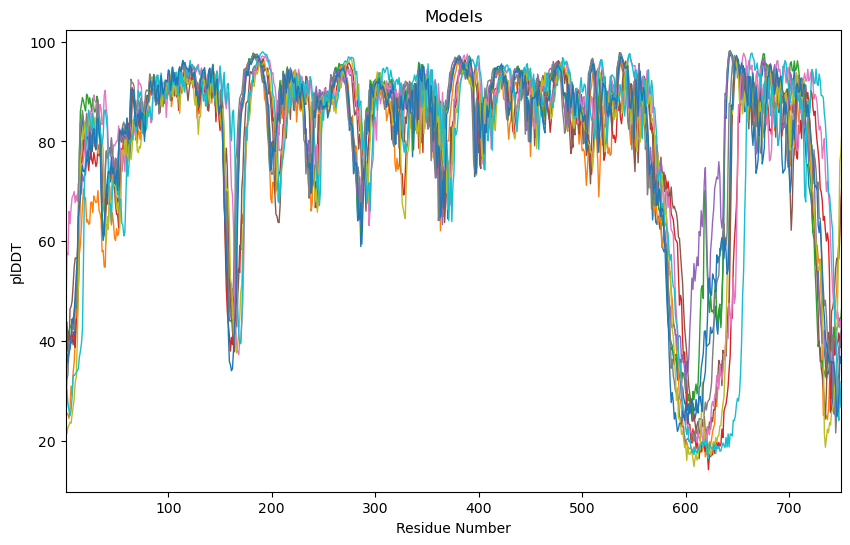

In [77]:
import os
import glob
import pickle
import json
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
# Plot pLDDT from each model

dirsA = sorted(glob.glob('/mnt/large/prestin_2023/ancestorsV2/AF2_output/*_unrelaxed_rank_1*scores*.json'))
dirsM = sorted(glob.glob('/mnt/large/prestin_2023/models/output/*_unrelaxed_rank_1*scores*.json'))



# List of JSON file paths
#json_files = ['data1.json', 'data2.json', 'data3.json']

# Create an empty list to store individual DataFrames
#dataframes = []
plt.figure(figsize=(10, 6))
# Load data from each JSON file into a DataFrame
for file in dirsA:
    df = pd.read_json(file)
    plt.plot(df['plddt'], lw=1)


plt.xlabel('Residue Number')
plt.ylabel('plDDT')
plt.xlim(1,750)
plt.title('Anc')
#plt.legend()
#plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
# Load data from each JSON file into a DataFrame
for file in dirsM:
    df = pd.read_json(file)
    plt.plot(df['plddt'], lw=1)

plt.xlabel('Residue Number')
plt.ylabel('plDDT')
plt.xlim(1,750)
plt.title('Models')
#plt.legend()
#plt.grid(True)
plt.show()
#




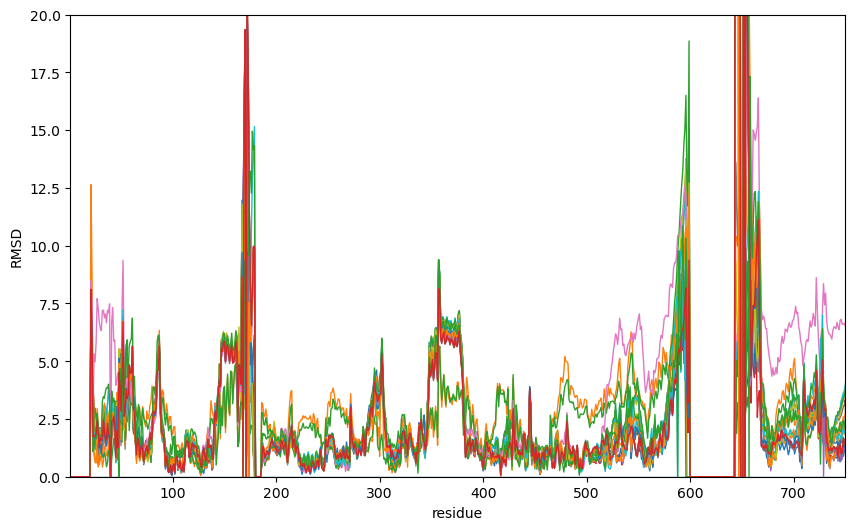

In [78]:


RMSD=np.genfromtxt('/mnt/large/prestin_2023/forMS/RMSD_vs_7s9b_DOWN_TMD_noAncAv.dat')

plt.figure(figsize=(10, 6))
plt.plot((RMSD[:,0]), RMSD[:, 1:], lw=1)
plt.xlabel('residue')
plt.ylabel('RMSD')
plt.xlim(1,750)
plt.ylim(0,20)
##plt.title('Data from Multiple JSON Files')
##plt.legend()
##plt.grid(True)
plt.show()



#fig.savefig('moreColors.png')
plt.show()

[93, 101, 122, 124, 136, 151, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 260, 261, 263, 270, 274, 280, 284, 295, 299, 337, 353, 360, 361, 363, 368, 392, 397, 405, 415, 428, 434, 438, 441, 445, 453, 456, 460, 470, 474, 475, 478, 494, 496, 521, 543, 553, 563, 565, 568, 575, 578, 618, 64, 623, 625, 629, 630, 634, 636, 637, 638, 648, 661, 662, 668, 673, 682, 685, 695, 696, 712, 713, 717, 718, 719, 721, 723, 225, 230, 240, 251, 252, 255, 256, 257, 260, 261, 191, 180, 181, 307, 310, 323, 326, 330, 340, 417]


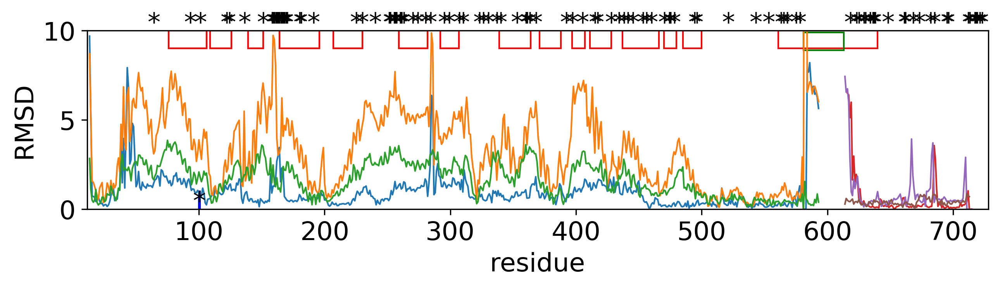

In [48]:
import matplotlib.patches as patches
#RMSD1=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_structures_vs_7LGU.dat')
#RMSD2=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_TMD.dat')
#RMSD3=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_STAS.dat')

RMSD1_=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_structures_vs_7LGU_from582.dat')
RMSD2_=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_structures_vs_7LGU_upto581.dat')
RMSD3_=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_TMD_from582.dat')
RMSD4_=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_TMD_upto581.dat')
RMSD6=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_STAS_from582.dat')
RMSD5=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_STAS_upto581.dat')



fig, ax = plt.subplots(figsize=(10, 2))

#plt.figure(figsize=(10, 2))
#ax.plot((RMSD1[:,0]+12), RMSD1[:,6], lw=1 , label='7S8X / Compact')
#ax.plot((RMSD1[:,0]+12), RMSD1[:,8], lw=1 , label='7S9B / Expanded')
#ax.plot((RMSD1[:,0]+12), RMSD1[:,10], lw=1, label='7LH3 / Expanded ')

ax.plot((RMSD5[:,0]+12), RMSD5[:,2], lw=1 , label='7S8X / Compact')
ax.plot((RMSD5[:,0]+12), RMSD5[:,3], lw=1 , label='7S9B / Expanded')
ax.plot((RMSD5[:,0]+12), RMSD5[:,4], lw=1, label='7LH3 / Expanded ')

ax.plot((RMSD6[:,0]+34), RMSD6[:,2], lw=1 , label='7S8X / Compact')
ax.plot((RMSD6[:,0]+32), RMSD6[:,3], lw=1 , label='7S9B / Expanded')
ax.plot((RMSD6[:,0]+32), RMSD6[:,4], lw=1, label='7LH3 / Expanded ')


plt.xlabel('residue')
plt.ylabel('RMSD')
ax.set_xlim(11,728)
ax.set_ylim(0,10)
#plt.legend(loc='best',fontsize=12, frameon=False)
##plt.grid(True)

# Create a Rectangle patch
rect1 = patches.Rectangle((76, 9), 30, 1, linewidth=1, edgecolor='r', facecolor='none')
rect2 = patches.Rectangle((109, 9), 17, 1, linewidth=1, edgecolor='r', facecolor='none')
rect3 = patches.Rectangle((139, 9), 12, 1, linewidth=1, edgecolor='r', facecolor='none')
rect4 = patches.Rectangle((164, 9), 32, 1, linewidth=1, edgecolor='r', facecolor='none')
rect5 = patches.Rectangle((207, 9), 23, 1, linewidth=1, edgecolor='r', facecolor='none')
rect6 = patches.Rectangle((259, 9), 23, 1, linewidth=1, edgecolor='r', facecolor='none')
rect7 = patches.Rectangle((292, 9), 15, 1, linewidth=1, edgecolor='r', facecolor='none')
rect8 = patches.Rectangle((339, 9), 25, 1, linewidth=1, edgecolor='r', facecolor='none')
rect9 = patches.Rectangle((371, 9), 17, 1, linewidth=1, edgecolor='r', facecolor='none')
rect10 = patches.Rectangle((397, 9), 10, 1, linewidth=1, edgecolor='r', facecolor='none')
rect11 = patches.Rectangle((411, 9), 17, 1, linewidth=1, edgecolor='r', facecolor='none')
rect12 = patches.Rectangle((437, 9), 29, 1, linewidth=1, edgecolor='r', facecolor='none')
rect13 = patches.Rectangle((470, 9), 10, 1, linewidth=1, edgecolor='r', facecolor='none')
rect14 = patches.Rectangle((485, 9), 15, 1, linewidth=1, edgecolor='r', facecolor='none')
rectIVS = patches.Rectangle((561, 9), 79, 1, linewidth=1, edgecolor='r', facecolor='none')
rectIVSloop = patches.Rectangle((581, 8.9), 32, 1, linewidth=1, edgecolor='g', facecolor='none')
rectT = patches.Rectangle((100, 0), 1, 1, linewidth=1, edgecolor='b', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect1)
ax.add_patch(rect2)
ax.add_patch(rect3)
ax.add_patch(rect4)
ax.add_patch(rect5)
ax.add_patch(rect6)
ax.add_patch(rect7)
ax.add_patch(rect1  )
ax.add_patch(rect2  )
ax.add_patch(rect3  )
ax.add_patch(rect4  )
ax.add_patch(rect5  )
ax.add_patch(rect6  )
ax.add_patch(rect7  )
ax.add_patch(rect8  )
ax.add_patch(rect9  )
ax.add_patch(rect10 ) 
ax.add_patch(rect11 ) 
ax.add_patch(rect12 ) 
ax.add_patch(rect13 ) 
ax.add_patch(rect14 ) 
ax.add_patch(rectIVS )
ax.add_patch(rectIVSloop )
ax.add_patch(rectT )
res_list="93 101 122 124 136 151 158 159 160 161 162 163 164 165 166 167 168 169 170 260 261 263 270 274 280 284 295 299 337 353 360 361 363 368 392 397 405 415 428 434 438 441 445 453 456 460 470 474 475 478 494 496 521 543 553 563 565 568 575 578 618 64 623 625 629 630 634 636 637 638 648  661 662 668  673  682 685 695 696 712 713 717 718 719  721 723 225 230 240 251 252 255 256 257 260 261 191 180 181 307 310 323 326 330 340 417"
list_1 = res_list.split()
#print(list_1)
xint=list(map(int, list_1))
print (xint)
for label, i in enumerate(xint):
   ax.annotate('*', xy=(i-5,10))

ax.annotate('*', xy=(100-5,0))


#ax.annotate('*',xy=(100-5,0),xycoords='data')
plt.savefig('/mnt/large/prestin_2023/for_anc_MS/Fig1_C3_align_STAS.pdf', dpi=300)
plt.show()

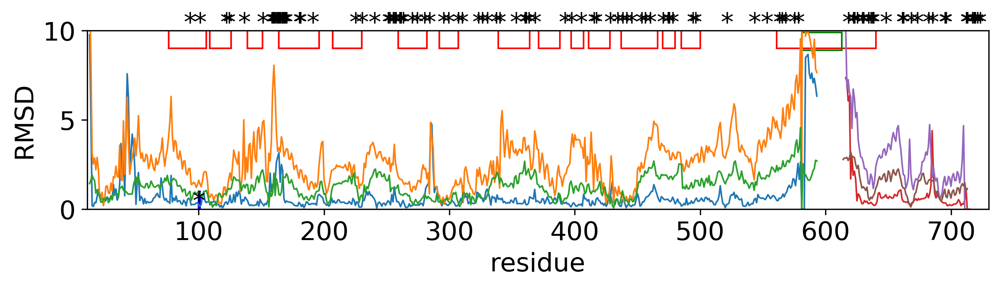

In [49]:
import matplotlib.patches as patches
#RMSD1=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_structures_vs_7LGU.dat')
#RMSD2=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_TMD.dat')
#RMSD3=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_STAS.dat')

RMSD22=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_structures_vs_7LGU_from582.dat')
RMSD12=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_structures_vs_7LGU_upto581.dat')

RMSD4=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_TMD_from582.dat')
RMSD3=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_TMD_upto581.dat')

RMSD6=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_STAS_from582.dat')
RMSD5=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_STAS_upto581.dat')



fig, ax = plt.subplots(figsize=(10, 2))


#plt.figure(figsize=(10, 2))
#ax.plot((RMSD1[:,0]+12), RMSD1[:,6], lw=1 , label='7S8X / Compact')
#ax.plot((RMSD1[:,0]+12), RMSD1[:,8], lw=1 , label='7S9B / Expanded')
#ax.plot((RMSD1[:,0]+12), RMSD1[:,10], lw=1, label='7LH3 / Expanded ')

ax.plot((RMSD3[:,0]+12), RMSD3[:,2], lw=1 , label='7S8X / Compact')
ax.plot((RMSD3[:,0]+12), RMSD3[:,3], lw=1 , label='7S9B / Expanded')
ax.plot((RMSD3[:,0]+12), RMSD3[:,4], lw=1, label='7LH3 / Expanded ')

ax.plot((RMSD4[:,0]+34), RMSD4[:,2], lw=1 , label='7S8X / Compact')
ax.plot((RMSD4[:,0]+32), RMSD4[:,3], lw=1 , label='7S9B / Expanded')
ax.plot((RMSD4[:,0]+32), RMSD4[:,4], lw=1, label='7LH3 / Expanded ')
#

plt.xlabel('residue')
plt.ylabel('RMSD')
ax.set_xlim(11,730)
ax.set_ylim(0,10)
#plt.legend(loc='best',fontsize=12, frameon=False)
##plt.grid(True)

# Create a Rectangle patch
rect1 = patches.Rectangle((76, 9), 30, 1, linewidth=1, edgecolor='r', facecolor='none')
rect2 = patches.Rectangle((109, 9), 17, 1, linewidth=1, edgecolor='r', facecolor='none')
rect3 = patches.Rectangle((139, 9), 12, 1, linewidth=1, edgecolor='r', facecolor='none')
rect4 = patches.Rectangle((164, 9), 32, 1, linewidth=1, edgecolor='r', facecolor='none')
rect5 = patches.Rectangle((207, 9), 23, 1, linewidth=1, edgecolor='r', facecolor='none')
rect6 = patches.Rectangle((259, 9), 23, 1, linewidth=1, edgecolor='r', facecolor='none')
rect7 = patches.Rectangle((292, 9), 15, 1, linewidth=1, edgecolor='r', facecolor='none')
rect8 = patches.Rectangle((339, 9), 25, 1, linewidth=1, edgecolor='r', facecolor='none')
rect9 = patches.Rectangle((371, 9), 17, 1, linewidth=1, edgecolor='r', facecolor='none')
rect10 = patches.Rectangle((397, 9), 10, 1, linewidth=1, edgecolor='r', facecolor='none')
rect11 = patches.Rectangle((411, 9), 17, 1, linewidth=1, edgecolor='r', facecolor='none')
rect12 = patches.Rectangle((437, 9), 29, 1, linewidth=1, edgecolor='r', facecolor='none')
rect13 = patches.Rectangle((470, 9), 10, 1, linewidth=1, edgecolor='r', facecolor='none')
rect14 = patches.Rectangle((485, 9), 15, 1, linewidth=1, edgecolor='r', facecolor='none')
rectIVS = patches.Rectangle((561, 9), 79, 1, linewidth=1, edgecolor='r', facecolor='none')
rectIVSloop = patches.Rectangle((581, 8.9), 32, 1, linewidth=1, edgecolor='g', facecolor='none')
rectT = patches.Rectangle((100, 0), 1, 1, linewidth=1, edgecolor='b', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect1)
ax.add_patch(rect2)
ax.add_patch(rect3)
ax.add_patch(rect4)
ax.add_patch(rect5)
ax.add_patch(rect6)
ax.add_patch(rect7)
ax.add_patch(rect1  )
ax.add_patch(rect2  )
ax.add_patch(rect3  )
ax.add_patch(rect4  )
ax.add_patch(rect5  )
ax.add_patch(rect6  )
ax.add_patch(rect7  )
ax.add_patch(rect8  )
ax.add_patch(rect9  )
ax.add_patch(rect10 ) 
ax.add_patch(rect11 ) 
ax.add_patch(rect12 ) 
ax.add_patch(rect13 ) 
ax.add_patch(rect14 ) 
ax.add_patch(rectIVS )
ax.add_patch(rectIVSloop )
ax.add_patch(rectT )
res_list="93 101 122 124 136 151 158 159 160 161 162 163 164 165 166 167 168 169 170 260 261 263 270 274 280 284 295 299 337 353 360 361 363 368 392 397 405 415 428 434 438 441 445 453 456 460 470 474 475 478 494 496 521 543 553 563 565 568 575 578 618 622 623 625 629 630 634 636 637 638 648  661 662 668  673  682 685 695 696 712 713 717 718 719  721 723 225 230 240 251 252 255 256 257 260 261 191 180 181 307 310 323 326 330 340 417"
list_1 = res_list.split()
#print(list_1)
xint=list(map(int, list_1))
#print (xint)
for label, i in enumerate(xint):
   ax.annotate('*', xy=(i-5,10))

ax.annotate('*', xy=(100-5,0))


#ax.annotate('*',xy=(100-5,0),xycoords='data')
plt.savefig('/mnt/large/prestin_2023/for_anc_MS/Fig1_C3_align_TMD.pdf', dpi=300)
plt.show()

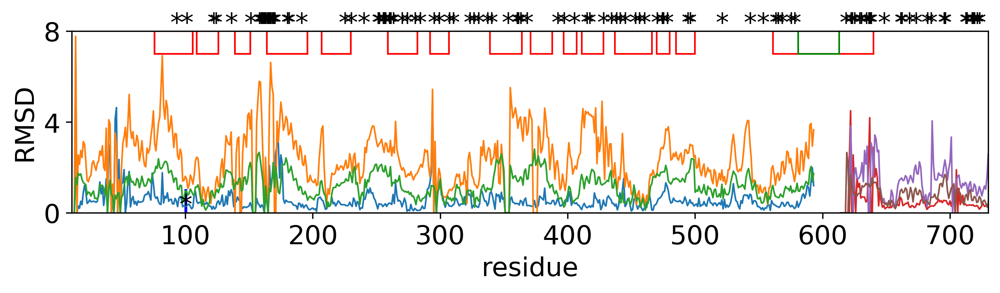

In [56]:
import matplotlib.patches as patches
#RMSD1=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_structures_vs_7LGU.dat')
#RMSD2=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_TMD.dat')
#RMSD3=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_STAS.dat')


RMSD6=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_all_from582.dat')
RMSD5=np.genfromtxt('/mnt/large/prestin_2023/for_anc_MS/RMSD_7s8x_7s9b_7lh3_vs_7LGU_all_upto581.dat')



fig, ax = plt.subplots(figsize=(10, 2))


#plt.figure(figsize=(10, 2))
#ax.plot((RMSD1[:,0]+12), RMSD1[:,6], lw=1 , label='7S8X / Compact')
#ax.plot((RMSD1[:,0]+12), RMSD1[:,8], lw=1 , label='7S9B / Expanded')
#ax.plot((RMSD1[:,0]+12), RMSD1[:,10], lw=1, label='7LH3 / Expanded ')

ax.plot((RMSD5[:,0]+12), RMSD5[:,2], lw=1 , label='7S8X / Compact')
ax.plot((RMSD5[:,0]+12), RMSD5[:,3], lw=1 , label='7S9B / Expanded')
ax.plot((RMSD5[:,0]+12), RMSD5[:,4], lw=1, label='7LH3 / Expanded ')

ax.plot((RMSD6[:,0]+34), RMSD6[:,2], lw=1 , label='7S8X / Compact')
ax.plot((RMSD6[:,0]+32), RMSD6[:,3], lw=1 , label='7S9B / Expanded')
ax.plot((RMSD6[:,0]+32), RMSD6[:,4], lw=1, label='7LH3 / Expanded ')
#

plt.xlabel('residue')
plt.ylabel('RMSD')
ax.set_xlim(11,730)
ax.set_ylim(0,8)
plt.yticks([0, 4, 8])
#plt.legend(loc='best',fontsize=12, frameon=False)
##plt.grid(True)

# Create a Rectangle patch
rect1 = patches.Rectangle((76, 7), 30, 1, linewidth=1, edgecolor='r', facecolor='none')
rect2 = patches.Rectangle((109, 7), 17, 1, linewidth=1, edgecolor='r', facecolor='none')
rect3 = patches.Rectangle((139, 7), 12, 1, linewidth=1, edgecolor='r', facecolor='none')
rect4 = patches.Rectangle((164, 7), 32, 1, linewidth=1, edgecolor='r', facecolor='none')
rect5 = patches.Rectangle((207, 7), 23, 1, linewidth=1, edgecolor='r', facecolor='none')
rect6 = patches.Rectangle((259, 7), 23, 1, linewidth=1, edgecolor='r', facecolor='none')
rect7 = patches.Rectangle((292, 7), 15, 1, linewidth=1, edgecolor='r', facecolor='none')
rect8 = patches.Rectangle((339, 7), 25, 1, linewidth=1, edgecolor='r', facecolor='none')
rect9 = patches.Rectangle((371, 7), 17, 1, linewidth=1, edgecolor='r', facecolor='none')
rect10 = patches.Rectangle((397, 7), 10, 1, linewidth=1, edgecolor='r', facecolor='none')
rect11 = patches.Rectangle((411, 7), 17, 1, linewidth=1, edgecolor='r', facecolor='none')
rect12 = patches.Rectangle((437, 7), 29, 1, linewidth=1, edgecolor='r', facecolor='none')
rect13 = patches.Rectangle((470, 7), 10, 1, linewidth=1, edgecolor='r', facecolor='none')
rect14 = patches.Rectangle((485, 7), 15, 1, linewidth=1, edgecolor='r', facecolor='none')
rectIVS = patches.Rectangle((561, 7), 79, 1, linewidth=1, edgecolor='r', facecolor='none')
rectIVSloop = patches.Rectangle((581, 7), 32, 1, linewidth=1, edgecolor='g', facecolor='none')
rectT = patches.Rectangle((100, 0), 1, 1, linewidth=1, edgecolor='b', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect1)
ax.add_patch(rect2)
ax.add_patch(rect3)
ax.add_patch(rect4)
ax.add_patch(rect5)
ax.add_patch(rect6)
ax.add_patch(rect7)
ax.add_patch(rect1  )
ax.add_patch(rect2  )
ax.add_patch(rect3  )
ax.add_patch(rect4  )
ax.add_patch(rect5  )
ax.add_patch(rect6  )
ax.add_patch(rect7  )
ax.add_patch(rect8  )
ax.add_patch(rect9  )
ax.add_patch(rect10 ) 
ax.add_patch(rect11 ) 
ax.add_patch(rect12 ) 
ax.add_patch(rect13 ) 
ax.add_patch(rect14 ) 
ax.add_patch(rectIVS )
ax.add_patch(rectIVSloop )
ax.add_patch(rectT )
res_list="93 101 122 124 136 151 158 159 160 161 162 163 164 165 166 167 168 169 170 260 261 263 270 274 280 284 295 299 337 353 360 361 363 368 392 397 405 415 428 434 438 441 445 453 456 460 470 474 475 478 494 496 521 543 553 563 565 568 575 578 618 622 623 625 629 630 634 636 637 638 648  661 662 668  673  682 685 695 696 712 713 717 718 719  721 723 225 230 240 251 252 255 256 257 260 261 191 180 181 307 310 323 326 330 340 417"
list_1 = res_list.split()
#print(list_1)
xint=list(map(int, list_1))
#print (xint)
for label, i in enumerate(xint):
   ax.annotate('*', xy=(i-5,8))

ax.annotate('*', xy=(100-5,0))


#ax.annotate('*',xy=(100-5,0),xycoords='data')
plt.savefig('/mnt/large/prestin_2023/for_anc_MS/Fig1_C3_align_all.pdf', dpi=300)
plt.show()